# Diffusers tutorial

This quick example gives two ways of loading pretrained models using the GitHub package [🤗 Diffusers](https://github.com/huggingface/diffusers): State-of-the-art diffusion models for image, video, and audio generation in PyTorch.

Generating outputs is super easy with 🤗 Diffusers. To generate an image from text, use the from_pretrained method to load any pretrained diffusion model (browse the [Hub](https://huggingface.co/models?library=diffusers&sort=downloads) for 30,000+ checkpoints):

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

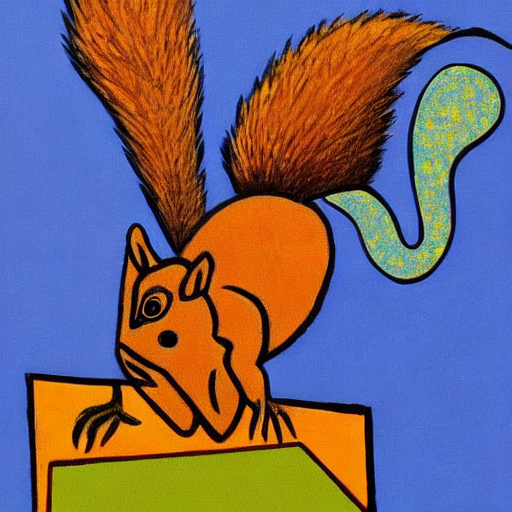

In [1]:
from diffusers import DiffusionPipeline
import torch

pipeline = DiffusionPipeline.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipeline.to("cuda")
pipeline("An image of a squirrel in Picasso style").images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

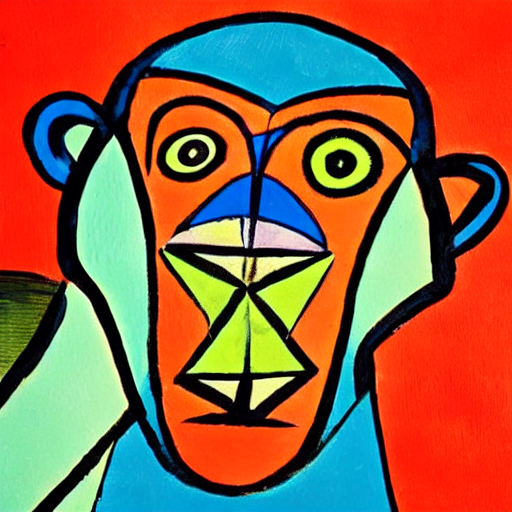

In [2]:
pipeline("An image of a monkey in Picasso style").images[0]

You can also dig into the models and schedulers toolbox to build your own diffusion system:

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


scheduler_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/790 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/455M [00:00<?, ?B/s]

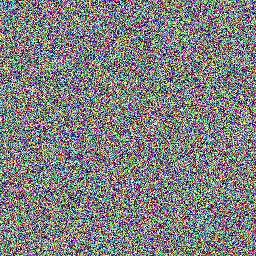

Iteration 1 complete.


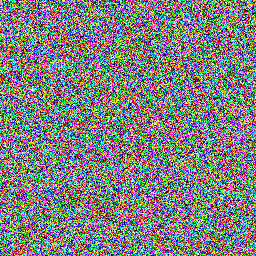

Iteration 2 complete.


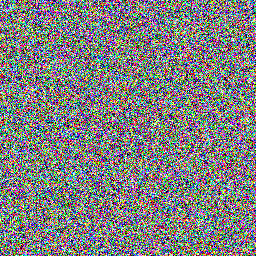

Iteration 3 complete.


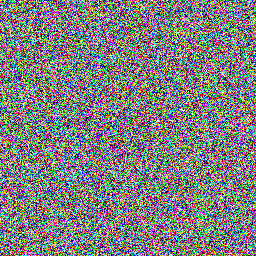

Iteration 4 complete.


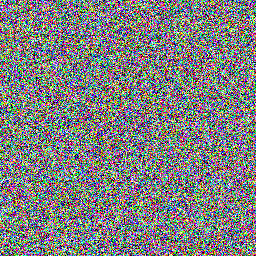

Iteration 5 complete.


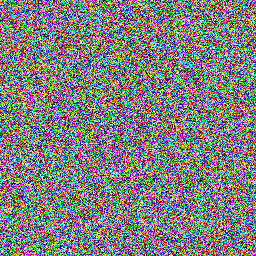

Iteration 6 complete.


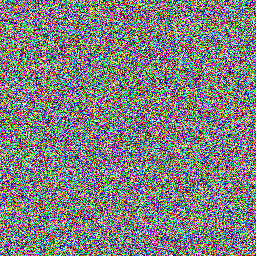

Iteration 7 complete.


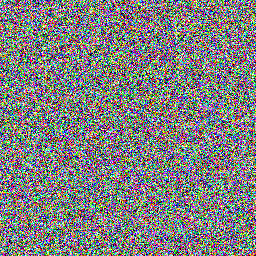

Iteration 8 complete.


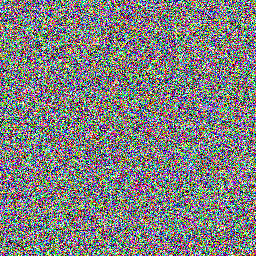

Iteration 9 complete.


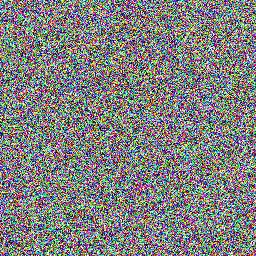

Iteration 10 complete.


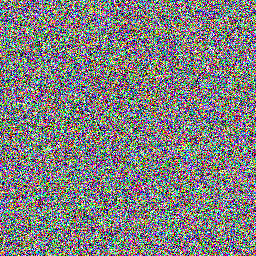

Iteration 11 complete.


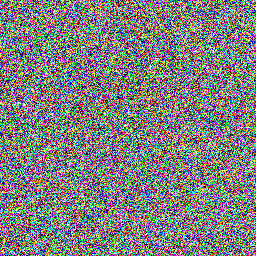

Iteration 12 complete.


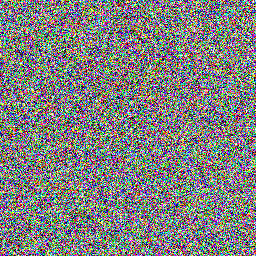

Iteration 13 complete.


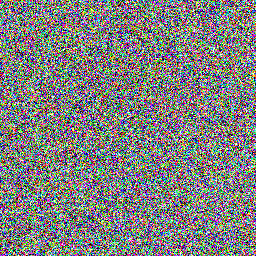

Iteration 14 complete.


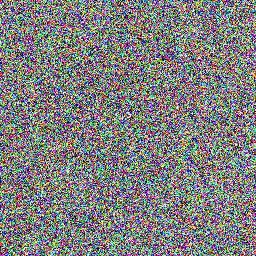

Iteration 15 complete.


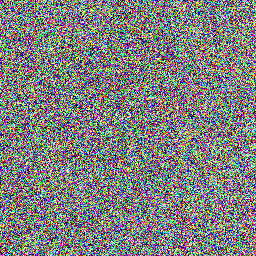

Iteration 16 complete.


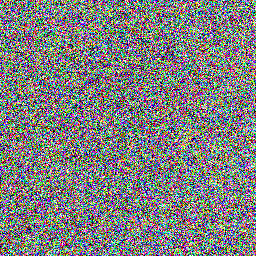

Iteration 17 complete.


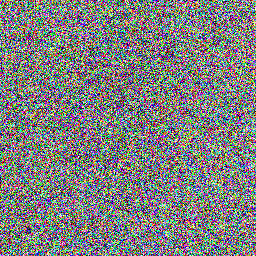

Iteration 18 complete.


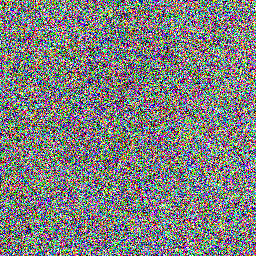

Iteration 19 complete.


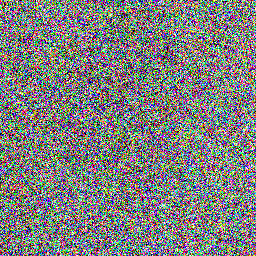

Iteration 20 complete.


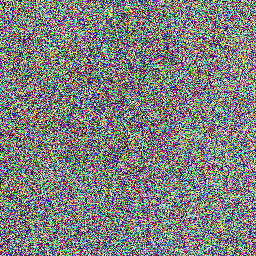

Iteration 21 complete.


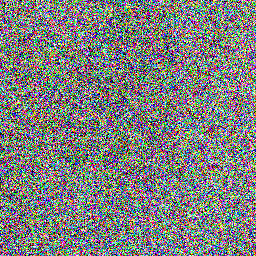

Iteration 22 complete.


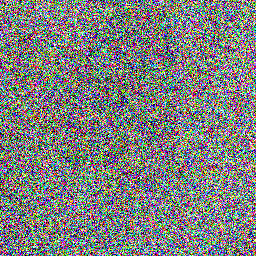

Iteration 23 complete.


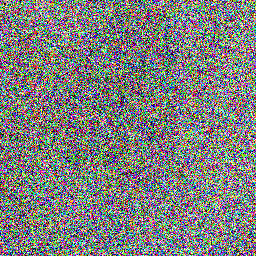

Iteration 24 complete.


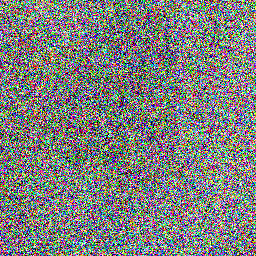

Iteration 25 complete.


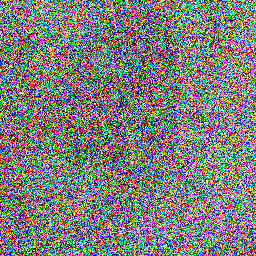

Iteration 26 complete.


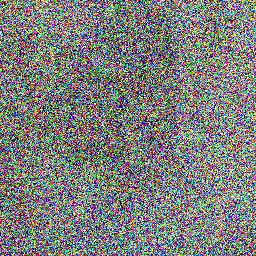

Iteration 27 complete.


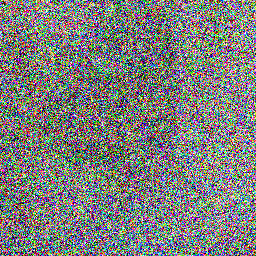

Iteration 28 complete.


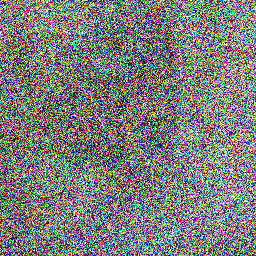

Iteration 29 complete.


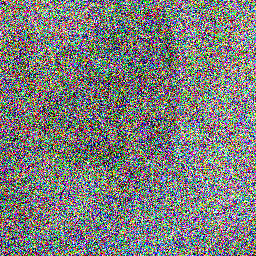

Iteration 30 complete.


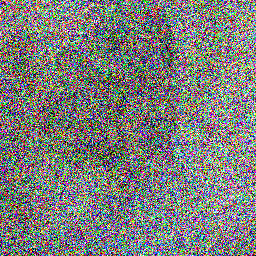

Iteration 31 complete.


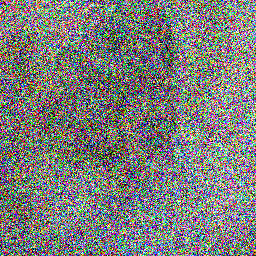

Iteration 32 complete.


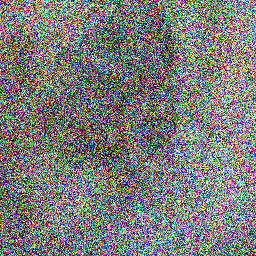

Iteration 33 complete.


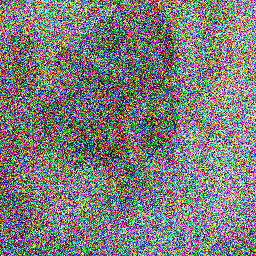

Iteration 34 complete.


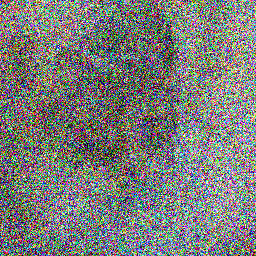

Iteration 35 complete.


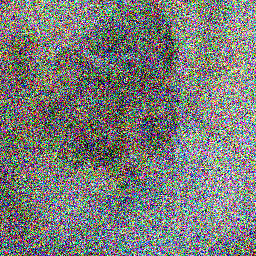

Iteration 36 complete.


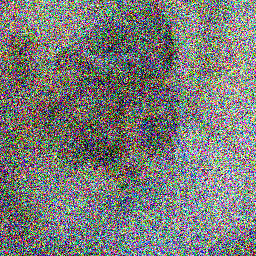

Iteration 37 complete.


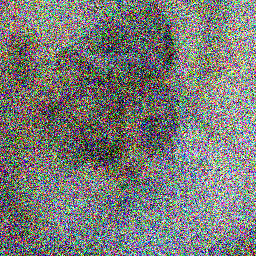

Iteration 38 complete.


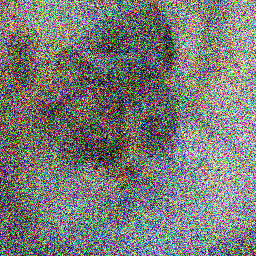

Iteration 39 complete.


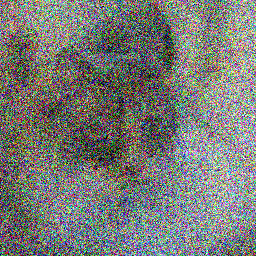

Iteration 40 complete.


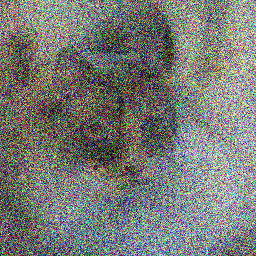

Iteration 41 complete.


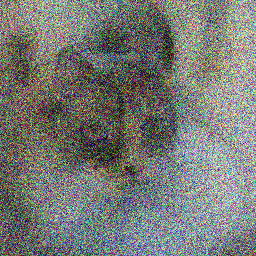

Iteration 42 complete.


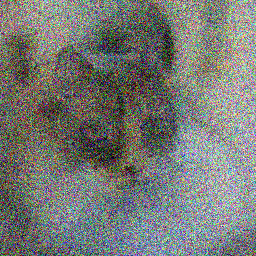

Iteration 43 complete.


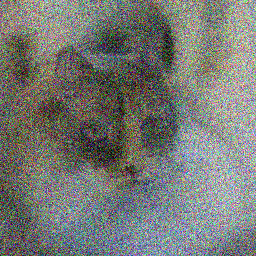

Iteration 44 complete.


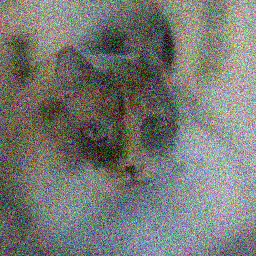

Iteration 45 complete.


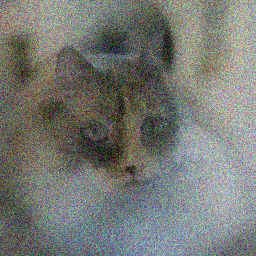

Iteration 46 complete.


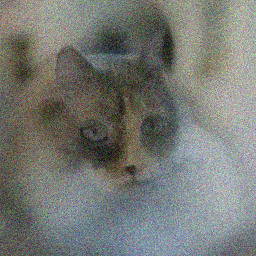

Iteration 47 complete.


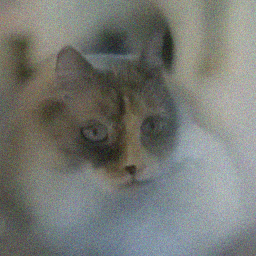

Iteration 48 complete.


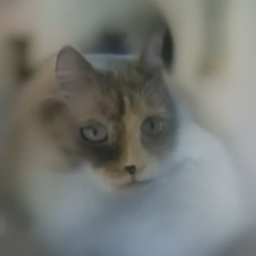

Iteration 49 complete.


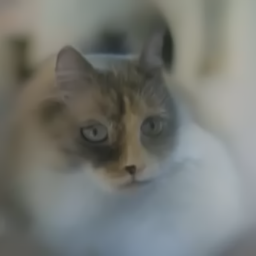

Iteration 50 complete.


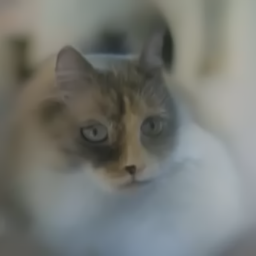

In [3]:
from diffusers import DDPMScheduler, UNet2DModel # Import the diffusion scheduler and U-Net model used for denoising
from PIL import Image # PIL is used to convert tensors into images
import torch # PyTorch for tensor operations and GPU support
import time # For pausing to display the image

# Load a pretrained DDPM noise scheduler
# This defines how noise is added/removed at each timestep
scheduler = DDPMScheduler.from_pretrained("google/ddpm-cat-256")

# Load a pretrained U-Net model trained to denoise cat images
# Move the model to the GPU for faster inference
model = UNet2DModel.from_pretrained("google/ddpm-cat-256").to("cuda")

# Set the number of denoising steps (fewer steps = faster but lower quality)
scheduler.set_timesteps(50)

# Get the image resolution the model was trained on (256)
sample_size = model.config.sample_size

# Create an initial image consisting of pure Gaussian noise
# Shape: (batch_size=1, channels=3, height=256, width=256)
noise = torch.randn((1, 3, sample_size, sample_size), device="cuda")

# Initialize the input to the noise (this will be iteratively denoised)
input = noise

i = 0
# Iteratively remove noise following the diffusion process
for t in scheduler.timesteps:
    i += 1
    with torch.no_grad():  # Disable gradient tracking (inference only)

        # Predict the noise present in the current image at timestep t
        noisy_residual = model(input, t).sample

        # Use the scheduler to compute the previous (less noisy) image
        prev_noisy_sample = scheduler.step(
            noisy_residual,  # predicted noise
            t,               # current timestep
            input            # current noisy image
        ).prev_sample

        # Update the input for the next step
        input = prev_noisy_sample

        disp_image = (input / 2 + 0.5).clamp(0, 1)
        disp_image = disp_image.cpu().permute(0, 2, 3, 1).numpy()[0]
        disp_image = Image.fromarray((disp_image * 255).round().astype("uint8"))
        display(disp_image)

        # Optional: Add a small delay to visually observe the change
        time.sleep(1)
        print(f"Iteration {i} complete.")

# Convert the final tensor from [-1, 1] range to [0, 1]
image = (input / 2 + 0.5).clamp(0, 1)

# Move image to CPU, change shape to (H, W, C), and convert to NumPy
image = image.cpu().permute(0, 2, 3, 1).numpy()[0]

# Convert NumPy array to a PIL image (0–255 uint8)
image = Image.fromarray((image * 255).round().astype("uint8"))

# The final generated image
image
